<a href="https://colab.research.google.com/github/AdinGarbowit/Prob-and-Stats--AG/blob/main/Notes_Hahn_Math_24_Lab_8.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
%%capture
!pip install wandb #installs weights and biases. This is a very important part of neural network programs
#it allows for the tracking and optimization of machine learning
!apt-get install poppler-utils #important for pdf manipulations and the functionality of pdf2image which is installed below
!pip install pdf2image #allows capability to take an image and turn it into a pdf
!pip install flashtorch #allows for gradient modeling for neural networks
import requests #allows to fetch things from the Web. Will be important for extracting images from a Google Slide
from pdf2image import convert_from_path #imports the above installed pdf2image to allow for pdf conversion
import matplotlib.pyplot as plt #imports plotting capabilities and abbrievates it to plt
import numpy as np #imports numerical operations into the code necessary for math
import torch #Machine learning library
import requests #allows to fetch things from the Web. Will be important for extracting images from a Google Slide
from torchvision import * #image transformation capabilities
from torchvision.models import * #image classifcation capabilities
import wandb as wb #imports the installed weights and biases and abbrieviates it to wb

In [ ]:

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu") #telling device where to perform operations
#it ideally performs computations on the GPU, but if that is unavailable, it will perform on the cpu

#Defining important functions
def GPU(data): #this function will be used to take data and convert it into a tensor
    return torch.tensor(data, requires_grad=True, dtype=torch.float, device=device) #the transformed data is optimized and put on the above defined device

def GPU_data(data): #Sane as the above function with the exception that gradient computations are not performed
    return torch.tensor(data, requires_grad=False, dtype=torch.float, device=device)

def plot(x): #creating an image plotting function
    fig, ax = plt.subplots() #this line creates the figure and axis
    im = ax.imshow(x, cmap = 'gray') #defines im as showing x on a grayscale
    ax.axis('off') #turns the x and y axis off
    fig.set_size_inches(5, 5) #sets the image size to five inches by five inches
    plt.show() #shows the plot

def get_google_slide(url): #this function will be used to get the google slide off the web
    url_head = "https://docs.google.com/presentation/d/" #the url head is defined as the generic google doc presentation head url
    url_body = url.split('/')[5] #Goes to the fifth / in the url and extracts the body url after the /
    page_id = url.split('.')[-1] #Goes to the last . in the url in order to extract the page id
    return url_head + url_body + "/export/pdf?id=" + url_body + "&pageid=" + page_id #puts the url together and downloads as a pdf

def get_slides(url): #this function will used the extracted google slide to take the individual slides
    url = get_google_slide(url) #url is defined as the output of the get_google_slide function
    r = requests.get(url, allow_redirects=True) #Goes to the url, allow_redirects means that if a page redirect occurs, the code will continue
    open('file.pdf', 'wb').write(r.content) #saved as a pdf in binary format (wb)
    images = convert_from_path('file.pdf', 500) #Now converts the pdf to images with 500 DPI
    return images #returns the images

def load(image, size=224): #making it such that the images will be compatible with neural network software
    means = [0.485, 0.456, 0.406] #defines what the means should be for the color channels
    stds = [0.229, 0.224, 0.225] #defines what the standard deviations should be for the color channels
    transform = transforms.Compose([
        transforms.Resize(size), #allows to resize an image to an inputted size
        transforms.CenterCrop(size), #allows to crop an image to an inputted size
        transforms.ToTensor(), #converts the image into a tensor
        transforms.Normalize(means, stds) #Normalizes the image to the inputted means and standard deviates
    ])
    tensor = transform(image).unsqueeze(0).to(device) #adds an additional dimension to the tensor
    tensor.requires_grad = True #allows for gradient computation
    return tensor #returns the final tensor



In [ ]:
labels = {int(key):value for (key, value) in requests.get('https://s3.amazonaws.com/mlpipes/pytorch-quick-start/labels.json').json().items()}
#defines labels as a set of labels taken from an already created library of labels

model = alexnet(weights='DEFAULT').to(device) #defines model as an AlexNet model and allocates it to the previously defined device
model.eval();

Downloading: "https://download.pytorch.org/models/alexnet-owt-7be5be79.pth" to /root/.cache/torch/hub/checkpoints/alexnet-owt-7be5be79.pth
100%|██████████| 233M/233M [00:02<00:00, 98.0MB/s]


In [1]:
url = "https://docs.google.com/presentation/d/1iQ-ZkW4VFDIsZgT320Ew3eDCTcIFUD7LmDnZRpT-7eY/edit#slide=id.g26a22223c09_0_396" #Google slide for training data

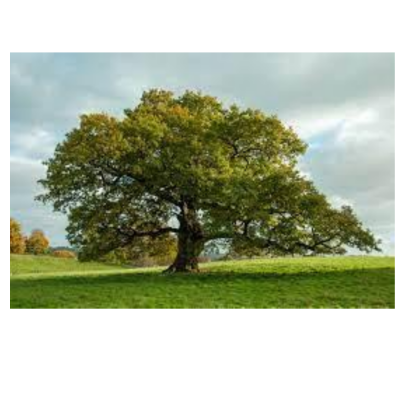

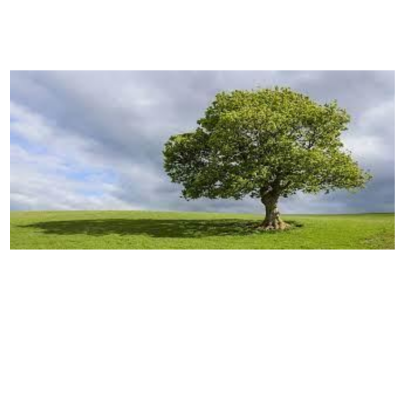

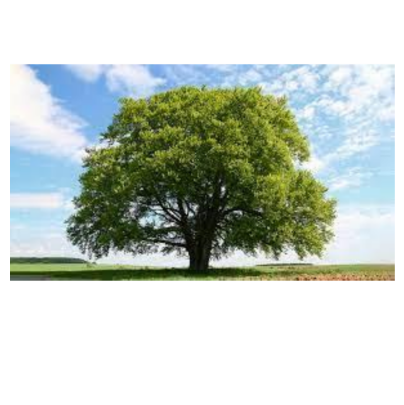

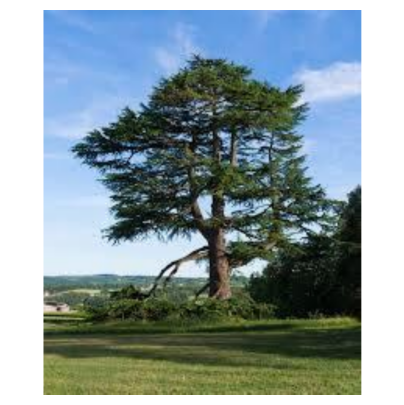

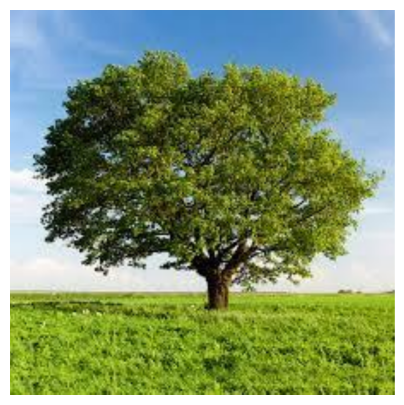

...

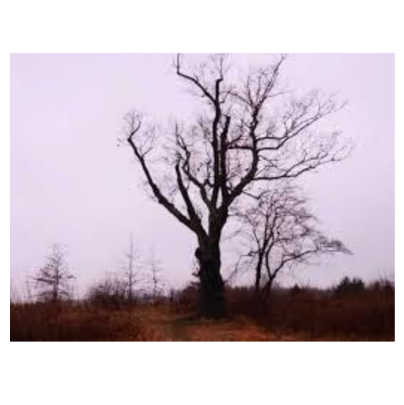

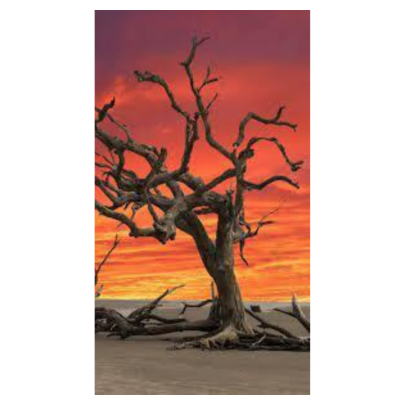

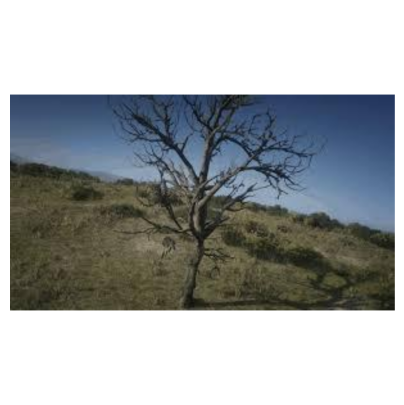

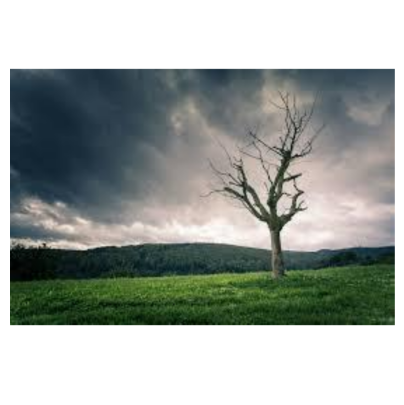

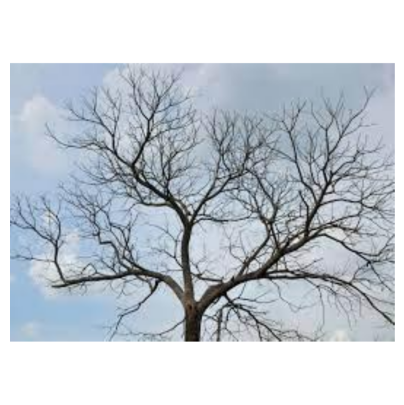

In [ ]:
images = [] #images begins as an empty list

for image in get_slides(url): #repeats the below process for the number of images that were generated from the get_slides function

    plot(image) #plots the image using the plot function

    images.append(load(image)) #performs the load function on the image

images = torch.vstack(images) #stacks the images above one another

In [ ]:
images.shape #prints the shape of the image [50 images, 3 colors channels, 224x224 size]

torch.Size([50, 3, 224, 224])

In [ ]:
model(images) #runs the above image through the AlexNet classification and prints the tensor output

tensor([[ 3.4147, -1.8570, -5.2561,  ..., -4.3699,  3.2971, -0.5082],
        [ 1.3986, -2.4090, -5.9988,  ..., -4.7374,  5.3070,  0.4517],
        [ 2.2468, -2.4193, -3.6698,  ..., -4.5981,  2.6258, -0.3302],
        ...,
        [ 1.8073, -3.0744, -2.9501,  ..., -4.1324,  2.7221, -0.4600],
        [ 1.3592, -3.3436, -3.7280,  ..., -3.4368,  4.0888, -0.5929],
        [-0.6651, -2.5735, -1.8777,  ..., -4.8783,  1.4636,  1.7728]],
       device='cuda:0', grad_fn=<AddmmBackward0>)

In [ ]:
y = model(images) #y is defined as the AlexNet model being applied to the images

In [ ]:
y.shape #prints the size of y

torch.Size([50, 1000])

In [ ]:
guesses = torch.argmax(y, 1).cpu().numpy() #finds the maximum values along the first axis, moves it to cpu, and it converts it to an array
#defines this operation as guesses

In [ ]:
for i in list(guesses): #for the number of images in guesses, the operation will repeat
    print(labels[i]) #prints each guess for each image using the argmax function

lakeside, lakeshore
cucumber, cuke
lakeside, lakeshore
flagpole, flagstaff
rapeseed
golf ball
rapeseed
maze, labyrinth
obelisk
seashore, coast, seacoast, sea-coast
lakeside, lakeshore
seashore, coast, seacoast, sea-coast
seashore, coast, seacoast, sea-coast
seashore, coast, seacoast, sea-coast
broccoli
lakeside, lakeshore
buckeye, horse chestnut, conker
lakeside, lakeshore
obelisk
broccoli
sandbar, sand bar
seashore, coast, seacoast, sea-coast
valley, vale
rapeseed
lakeside, lakeshore
studio couch, day bed
bald eagle, American eagle, Haliaeetus leucocephalus
pedestal, plinth, footstall
flagpole, flagstaff
obelisk
zebra
seashore, coast, seacoast, sea-coast
worm fence, snake fence, snake-rail fence, Virginia fence
hartebeest
impala, Aepyceros melampus
lakeside, lakeshore
stone wall
gazelle
rapeseed
lakeside, lakeshore
albatross, mollymawk
tabby, tabby cat
lakeside, lakeshore
zebra
rapeseed
lakeside, lakeshore
book jacket, dust cover, dust jacket, dust wrapper
viaduct
lakeside, lakeshore


In [ ]:
Y = np.zeros(50,) #creates an array of 50 zeros and defines it as Y
Y[25:] = 1 #Every 0 from position 25 to position 50 is converted into a 1

In [ ]:
Y #prints the array Y (half ones and half zeros)

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
# Y = np.zeros(100,)
# Y[50:] = 1

In [ ]:
Y #prints the array Y (half ones and half zeros)

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [ ]:
X = y.detach().cpu().numpy() #defines X as y being moved to the cpu and converted into an array

In [ ]:
X.shape #prints the size of X

(50, 1000)

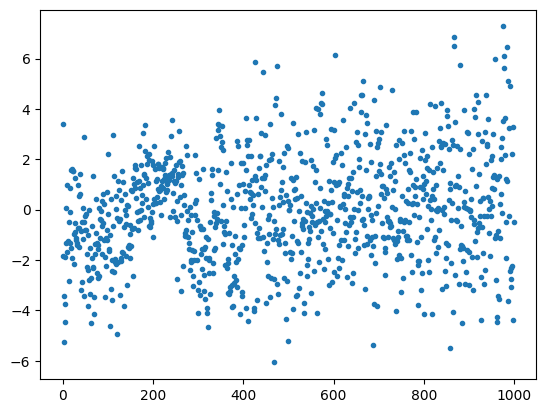

In [ ]:
plt.plot(X[0],'.') #plots the first row of values from X as dots

(array([  6.,  49., 109., 205., 253., 201., 111.,  48.,  11.,   7.]),
 array([-6.07128906, -4.73669386, -3.40209889, -2.06750393, -0.73290884,
         0.60168624,  1.93628132,  3.27087641,  4.60547161,  5.94006634,
         7.27466154]),
 <BarContainer object of 10 artists>)

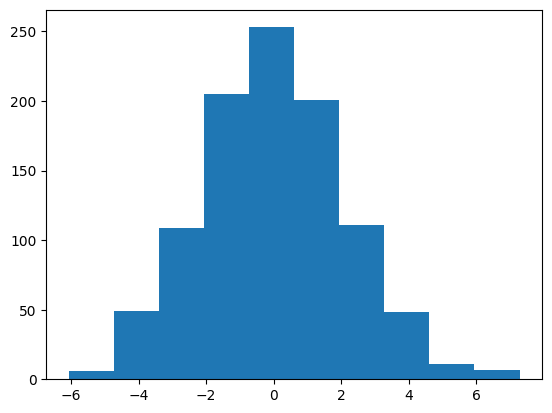

In [ ]:
plt.hist(X[0]) #plots the first row of values from X as a histogram

In [ ]:
X = GPU_data(X) #X is redefined as the GPU_data function being applied to X
Y = GPU_data(Y) #Y is redefined as the GPU_data function being applied to Y

In [ ]:
def softmax(x): #creating a softmax function
    s1 = torch.exp(x - torch.max(x,1)[0][:,None]) #s1 is defined as x being subtracted by the maximum value of each row of x
    s = s1 / s1.sum(1)[:,None] #s is defined as s1 divided by summation of each row of s1
    return s #returns the value of s

In [ ]:
def cross_entropy(outputs, labels): #creating a cross_entropy function
    return -torch.sum(softmax(outputs).log()[range(outputs.size()[0]), labels.long()])/outputs.size()[0] #creates the equation seen in the image below
    #computes loss between model outputs and model labels

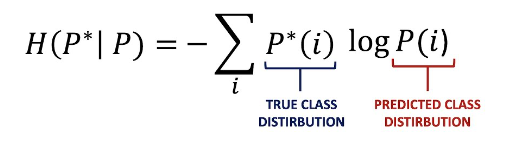

In [ ]:
def randn_trunc(s): #Truncated Normal Random Numbers
    mu = 0 #defines mean as 0
    sigma = 0.1 #defiens standard deviation as 0.1
    R = stats.truncnorm((-2*sigma - mu) / sigma, (2*sigma - mu) / sigma, loc=mu, scale=sigma) #creates a truncated normal distribution using .truncnorm. Defines the function as R
    return R.rvs(s) #returns random samples from the created R

In [ ]:
def Truncated_Normal(size): #creating a truncated normal function with the input of the desired size of the tensor

    u1 = torch.rand(size)*(1-np.exp(-2)) + np.exp(-2) #creates a random number between 0 and 1
    u2 = torch.rand(size) #creates a random nunber between 0 and 1
    z  = torch.sqrt(-2*torch.log(u1)) * torch.cos(2*np.pi*u2) #takes the pair of random numbers and converts them to normal distribution

    return z #returns the value of z

In [ ]:
def acc(out,y): #This function will be used to test the accuracy of the model's predictions
#out is the model prediction whereas y is the actual label
    with torch.no_grad(): #disables gradient computation
        return (torch.sum(torch.max(out,1)[1] == y).item())/y.shape[0] #checks the number of correct predictions and then normalizes by dividing by y

In [ ]:
X.shape #prints the shape of x

torch.Size([50, 1000])

In [ ]:
def get_batch(mode): #creating a function to retrieve a batch of data
    b = c.b #takes the batch size from c
    if mode == "train": #if taking the batch from the training set, the code continues
        r = np.random.randint(X.shape[0]-b) #defines r as a random integer within the batch size
        x = X[r:r+b,:] #defines x as an input randomly taken starting at r
        y = Y[r:r+b] #defines y as an input randomly taken starting at r
    elif mode == "test": #if taking the batch from the testing set, the code continues here
        r = np.random.randint(X_test.shape[0]-b) #defines r as a random integer within the batch size
        x = X[r:r+b,:] #defines x as an input randomly taken starting at r
        y = Y[r:r+b] #defines y as an input randomly taken starting at r
    return x,y #returns the values of x,y

In [ ]:
def model(x,w): #defining a model between x and w

    return x@w[0] #model is defined as the matrix mutlipication of x and w

In [ ]:
def make_plots(): #will track the accuracy of the model

    acc_train = acc(model(x,w),y) #determines how accurate the neural network training is by checking the accuracy of its output

    # xt,yt = get_batch('test')

    # acc_test = acc(model(xt,w),yt)

    wb.log({"acc_train": acc_train}) #Uploads the training accuracy to the Weights and Biases

In [ ]:
wb.init(project="Linear_Model_Photo_1"); #initializes weights and biases and naming it Linear_Model_Photo_1
c = wb.config #c is defined as the configuration settings for weights and biases

c.h = 0.001 #The learn rate is set to 0.001
c.b = 32 #The batch size is set to 32
c.epochs = 100000 #The training epochs is set to 100000

w = [GPU(Truncated_Normal((1000,2)))] #creates the weight parameter (defined as w) using random truncated normal distribution numbers

optimizer = torch.optim.Adam(w, lr=c.h) #defines an optimization process for the model parameters

for i in range(c.epochs): #repeats the process for the number of inputted training epochs (100000)

    x,y = get_batch('train') #takes the training data and defines it as x,y

    loss = cross_entropy(softmax(model(x,w)),y) #loss is defined as using the cross_entropy function on the softmax of the model

    optimizer.zero_grad() #computes the gradiants
    loss.backward()
    optimizer.step()#Updates model parameters based on the newly computed gradients

    wb.log({"loss": loss}) #uploads the computed loss to Weights and Biases

    make_plots() #generates the plots for the code

<IPython.core.display.Javascript object>